In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset

df = pd.read_csv("ObesityDataSet_raw_and_data_sinthetic.csv")


DATA PREPROCESSING AND ANALYSIS

In [ ]:


# Display basic info about the dataset
print(df.info())

# Handling missing values
missing_values = df.isnull().sum()
print("Missing Values:")
print(missing_values)

# Dropping duplicates if present
df.drop_duplicates(inplace=True)

# Encoding categorical attributes
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['Gender'] = le.fit_transform(df['Gender'])
df['CAEC'] = le.fit_transform(df['CAEC'])
df['MTRANS'] = le.fit_transform(df['MTRANS'])




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   object 
 1   Age                             2111 non-null   float64
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   object 
 12  FAF                             21

In [ ]:
# Exploratory Data Analysis (EDA)
# Summary statistics
summary_stats = df.describe()
print("Summary Statistics:")
print(summary_stats)



Summary Statistics:
            Gender          Age       Height       Weight         FCVC  \
count  2087.000000  2087.000000  2087.000000  2087.000000  2087.000000   
mean      0.504073    24.353090     1.702674    86.858730     2.421466   
std       0.500103     6.368801     0.093186    26.190847     0.534737   
min       0.000000    14.000000     1.450000    39.000000     1.000000   
25%       0.000000    19.915937     1.630178    66.000000     2.000000   
50%       1.000000    22.847618     1.701584    83.101100     2.396265   
75%       1.000000    26.000000     1.769491   108.015907     3.000000   
max       1.000000    61.000000     1.980000   173.000000     3.000000   

               NCP         CAEC         CH2O          FAF          TUE  \
count  2087.000000  2087.000000  2087.000000  2087.000000  2087.000000   
mean      2.701179     1.853857     2.004749     1.012812     0.663035   
std       0.764614     0.459494     0.608284     0.853475     0.608153   
min       1.00000

<ipython-input-83-b9a2f399027e>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt='.2f')


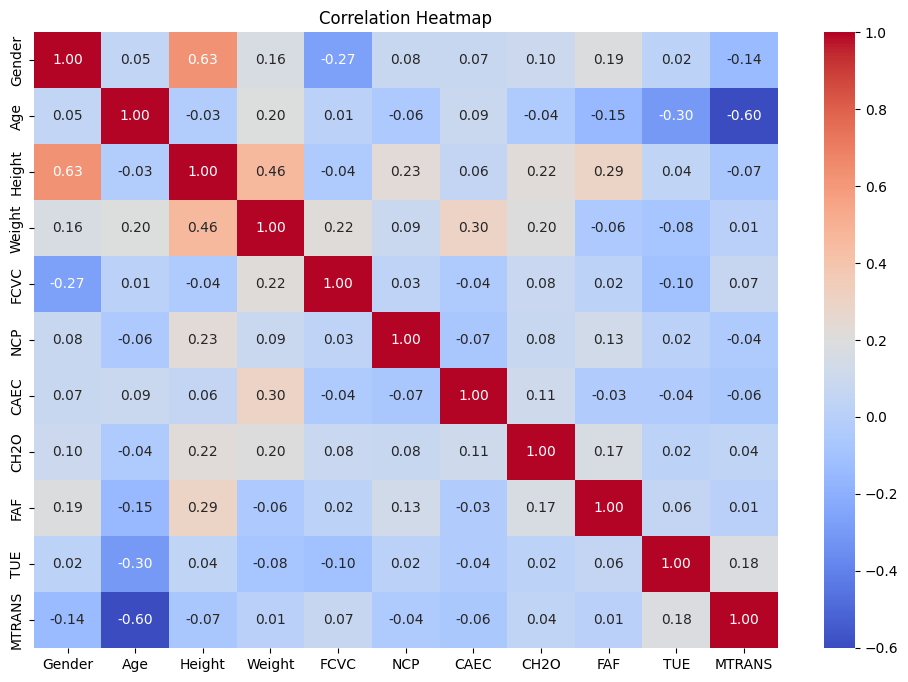

In [ ]:
# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()



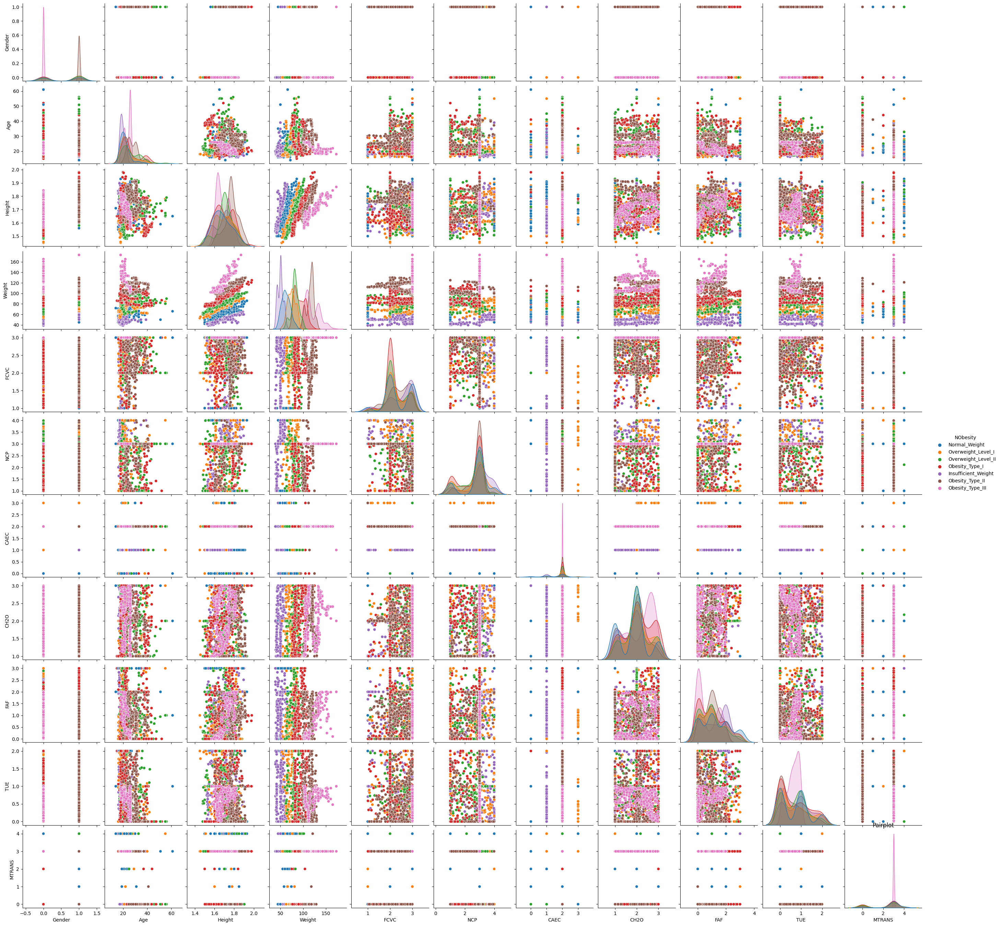

In [ ]:
# Pairplot for feature relationships
sns.pairplot(df, hue='NObesity')
plt.title('Pairplot')
plt.show()

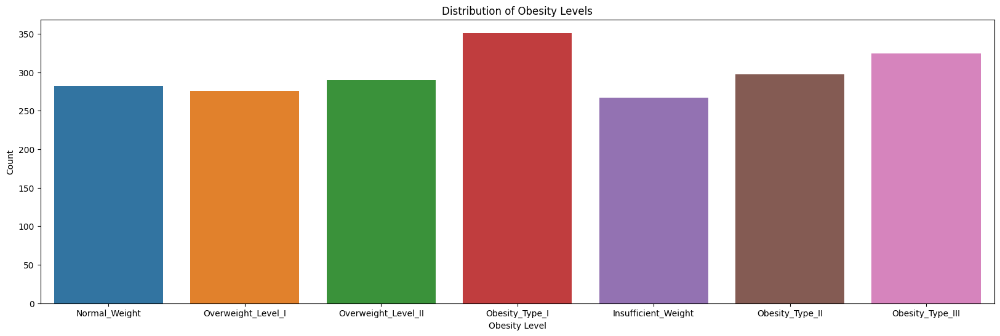

In [ ]:
# Distribution of Obesity Levels
plt.figure(figsize=(20, 6))
sns.countplot(x='NObesity', data=df)
plt.title('Distribution of Obesity Levels')
plt.xlabel('Obesity Level')
plt.ylabel('Count')
plt.show()

In [ ]:
# Encoding categorical attributes
le = LabelEncoder()
df['Gender'] = le.fit_transform(df['Gender'])
df['CAEC'] = le.fit_transform(df['CAEC'])
df['MTRANS'] = le.fit_transform(df['MTRANS'])
df['family_history_with_overweight'] = le.fit_transform(df['family_history_with_overweight'])
df['FAVC'] = le.fit_transform(df['FAVC'])
df['SMOKE'] = le.fit_transform(df['SMOKE'])
df['SCC'] = le.fit_transform(df['SCC'])
df['CALC'] = le.fit_transform(df['CALC'])
df['NObesity'] = le.fit_transform(df['NObesity'])


# Feature scaling for numerical attributes
scaler = StandardScaler()
numerical_features = ['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']
df[numerical_features] = scaler.fit_transform(df[numerical_features])


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize label encoder
label_encoder = LabelEncoder()

# Encode the target variable 'NObesity'
df['NObesity'] = label_encoder.fit_transform(df['NObesity'])

# Separate features and target variable
X = df.drop('NObesity', axis=1)
y = df['NObesity']

# Rest of your code for training and evaluating the model


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix



# Splitting the dataset into features and target variable
X = df.drop('NObesity', axis=1)
y = df['NObesity']

# Splitting the data into 80% training and 20% validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)
X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Model Training and Evaluation
def evaluate_model(model, X, y_true):
    y_pred = model.predict(X)
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    conf_matrix = confusion_matrix(y_true, y_pred)

    print(f"Accuracy: {accuracy:.2f}")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1 Score: {f1:.2f}")
    print("Confusion Matrix:")
    print(conf_matrix)




In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Assuming X_train, X_valid, y_train, y_valid are already defined from train_test_split

# Initialize Linear Regression model
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

# Predict on the validation set
y_pred = lin_reg.predict(X_valid)

# Convert the predicted values to discrete classes (assuming multi-class classification)
# For binary classification, you may set a threshold to decide classes
threshold = 0.5  # Define a threshold if needed
y_pred_classes = [1 if pred >= threshold else 0 for pred in y_pred]

# Evaluate the classification
print("Linear Regression Classification Metrics:")
print("Accuracy:", accuracy_score(y_valid, y_pred_classes))
print("\nClassification Report:")
print(classification_report(y_valid, y_pred_classes))
print("\nConfusion Matrix:")
print(confusion_matrix(y_valid, y_pred_classes))


Linear Regression Classification Metrics:
Accuracy: 0.15639810426540285

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        22
           1       0.16      1.00      0.27        33
           2       0.00      0.00      0.00        44
           3       0.00      0.00      0.00        26
           4       0.00      0.00      0.00        33
           5       0.00      0.00      0.00        28
           6       0.00      0.00      0.00        25

    accuracy                           0.16       211
   macro avg       0.02      0.14      0.04       211
weighted avg       0.02      0.16      0.04       211


Confusion Matrix:
[[ 0 22  0  0  0  0  0]
 [ 0 33  0  0  0  0  0]
 [ 0 44  0  0  0  0  0]
 [ 0 26  0  0  0  0  0]
 [ 0 33  0  0  0  0  0]
 [ 0 28  0  0  0  0  0]
 [ 0 25  0  0  0  0  0]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
print("Random Forest Classifier Results:")
evaluate_model(rf_model, X_valid, y_valid)





Random Forest Classifier Results:
Accuracy: 0.96
Precision: 0.97
Recall: 0.96
F1 Score: 0.96
Confusion Matrix:
[[29  3  0  0  0  0  0]
 [ 0 28  0  0  0  0  0]
 [ 0  0 33  0  0  0  0]
 [ 0  0  0 33  0  0  0]
 [ 0  0  0  0 30  0  0]
 [ 0  4  0  0  0 22  0]
 [ 0  1  0  0  0  0 26]]


In [ ]:
# Support Vector Machine (SVM)
svm_model = SVC(random_state=42)
svm_model.fit(X_train, y_train)
print("\nSupport Vector Machine (SVM) Results:")
evaluate_model(svm_model, X_valid, y_valid)


Support Vector Machine (SVM) Results:
Accuracy: 0.92
Precision: 0.93
Recall: 0.92
F1 Score: 0.92
Confusion Matrix:
[[27  5  0  0  0  0  0]
 [ 2 23  0  0  0  3  0]
 [ 0  0 32  0  0  1  0]
 [ 0  0  0 33  0  0  0]
 [ 0  0  0  0 30  0  0]
 [ 0  2  0  0  0 22  2]
 [ 0  0  0  0  0  1 26]]


In [ ]:
# Decision Trees
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)
print("\nDecision Trees Results:")
evaluate_model(dt_model, X_valid, y_valid)


Decision Trees Results:
Accuracy: 0.91
Precision: 0.91
Recall: 0.91
F1 Score: 0.91
Confusion Matrix:
[[56  3  0  0  0  0  0]
 [ 7 42  0  0  0 12  0]
 [ 0  0 65  3  0  0  2]
 [ 0  0  2 62  0  0  0]
 [ 0  0  0  0 60  0  0]
 [ 0  5  1  0  0 48  1]
 [ 0  0  2  0  0  0 47]]


Clustering Analysis

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


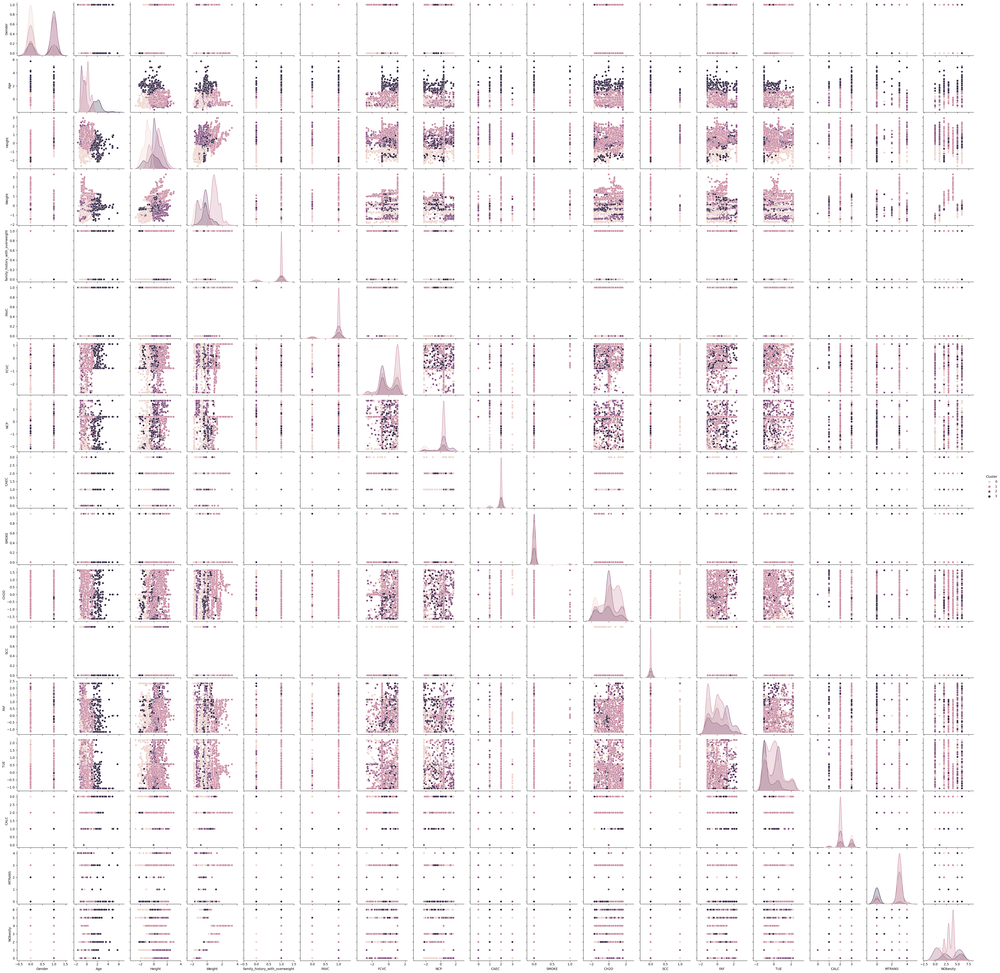

In [ ]:

# Clustering Analysis (K-means)
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=42)
X_clustered = df[['Age', 'Height', 'Weight']]
df['Cluster'] = kmeans.fit_predict(X_clustered)

# Visualize clusters
sns.pairplot(df, hue='Cluster')
plt.show()

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Assuming X_train, X_valid, y_train, y_valid are already defined from train_test_split

# Initialize KNN model
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

# Predict on the validation set
y_pred = knn.predict(X_valid)

# Evaluate the classification
print("KNN Classification Metrics:")
print("Accuracy:", accuracy_score(y_valid, y_pred))
print("Precision:", precision_score(y_valid, y_pred, average='weighted'))
print("Recall:", recall_score(y_valid, y_pred, average='weighted'))
print("F1 Score:", f1_score(y_valid, y_pred, average='weighted'))
print("Confusion Matrix:")
print(confusion_matrix(y_valid, y_pred))


KNN Classification Metrics:
Accuracy: 0.8151658767772512
Precision: 0.8259889671691649
Recall: 0.8151658767772512
F1 Score: 0.8049750230725434
Confusion Matrix:
[[20  0  0  0  0  2  0]
 [ 5 15  4  1  0  5  3]
 [ 0  0 41  1  0  0  2]
 [ 0  0  1 25  0  0  0]
 [ 0  0  0  0 33  0  0]
 [ 2  1  1  0  0 22  2]
 [ 0  0  3  1  2  3 16]]


QUANTIATIVE EXPERIMENTS

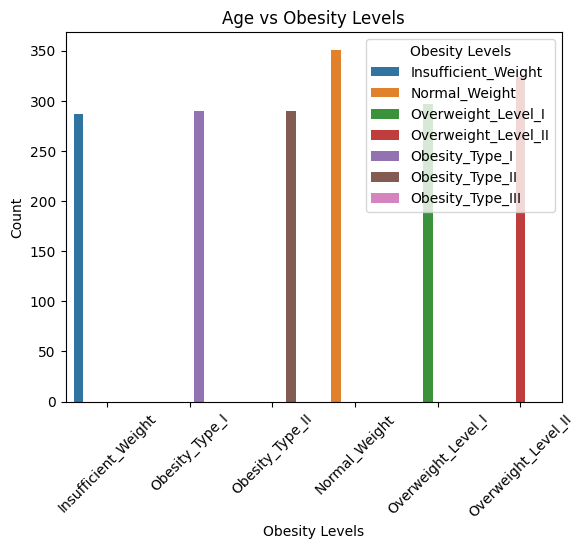

In [ ]:
# Create categorical labels for obesity levels
obesity_labels = {
    1: 'Insufficient_Weight',
    2: 'Normal_Weight',
    3: 'Overweight_Level_I',
    4: 'Overweight_Level_II',
    5: 'Obesity_Type_I',
    6: 'Obesity_Type_II',
    7: 'Obesity_Type_III'
}

# Map numeric labels to categorical names
df['NObesity_Labels'] = df['NObesity'].map(obesity_labels)

# Visualizing Age vs Obesity levels
sns.countplot(x='NObesity_Labels', hue='NObesity_Labels', data=df, hue_order=obesity_labels.values())
plt.title('Age vs Obesity Levels')
plt.xlabel('Obesity Levels')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Obesity Levels')
plt.show()


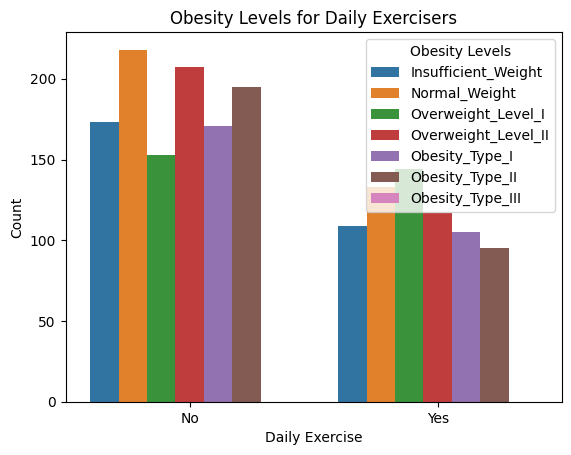

In [ ]:
# Create a new column to represent daily exercisers
df['Daily_Exerciser'] = df['FAF'].apply(lambda x: 'Yes' if x > 0 else 'No')

# Visualizing obesity levels for individuals who do exercise daily
sns.countplot(x='Daily_Exerciser', hue='NObesity_Labels', data=df, hue_order=obesity_labels.values())
plt.title('Obesity Levels for Daily Exercisers')
plt.xlabel('Daily Exercise')
plt.ylabel('Count')
plt.legend(title='Obesity Levels')
plt.show()


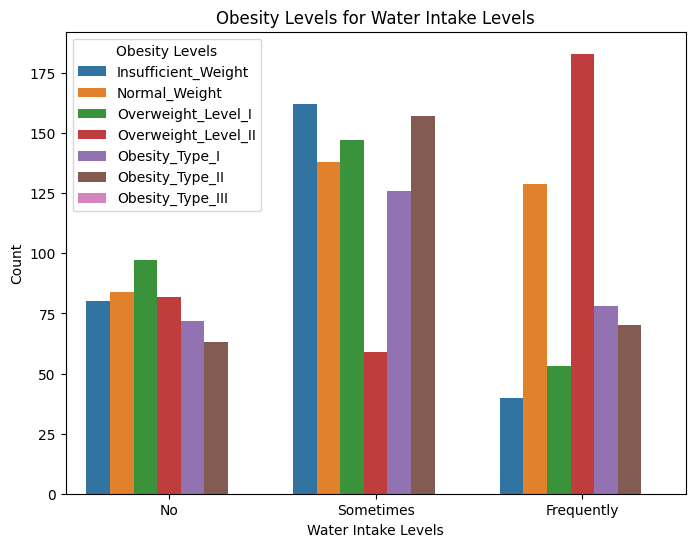

In [ ]:


# Create a new column to represent water intake categories
water_categories = {
    1: 'No',
    2: 'Sometimes',
    3: 'Frequently'
}

# Map numeric labels to categorical names for water intake
df['Water_Intake'] = pd.cut(df['CH2O'], bins=3, labels=water_categories.values())

# Visualizing obesity levels for different water intake levels
plt.figure(figsize=(8, 6))
sns.countplot(x='Water_Intake', hue='NObesity_Labels', data=df, hue_order=obesity_labels.values())
plt.title('Obesity Levels for Water Intake Levels')
plt.xlabel('Water Intake Levels')
plt.ylabel('Count')
plt.legend(title='Obesity Levels')
plt.show()


QUALITATIVE ANALYSIS

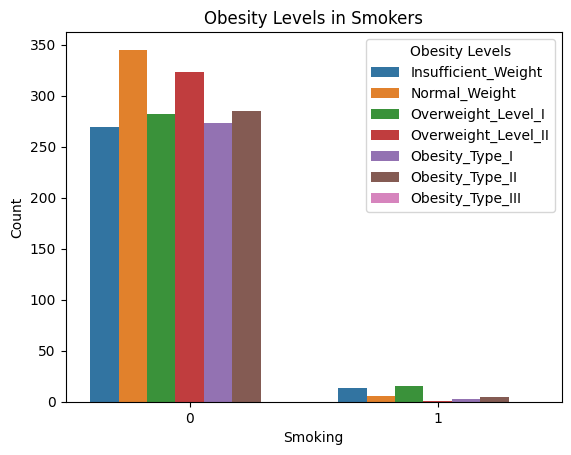

In [ ]:
# Visualizing obesity levels for smokers
#0-No smoking, 1-smoking
sns.countplot(x='SMOKE', hue='NObesity_Labels', data=df, hue_order=obesity_labels.values())
plt.title('Obesity Levels in Smokers')
plt.xlabel('Smoking')
plt.ylabel('Count')
plt.legend(title='Obesity Levels')
plt.show()


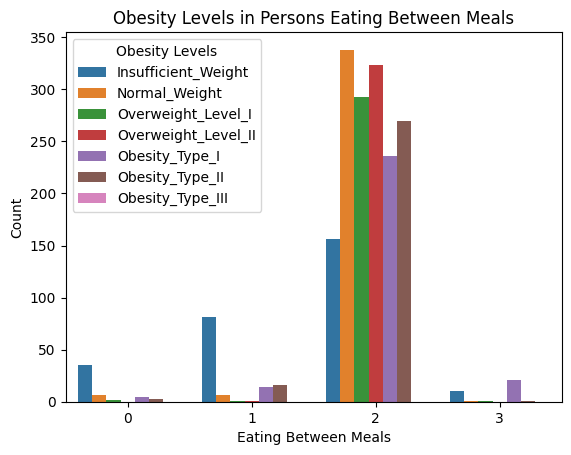

In [ ]:
# Visualizing obesity levels for individuals who eat between meals
sns.countplot(x='CAEC', hue='NObesity_Labels', data=df, hue_order=obesity_labels.values())
plt.title('Obesity Levels in Persons Eating Between Meals')
plt.xlabel('Eating Between Meals')
plt.ylabel('Count')
plt.legend(title='Obesity Levels')
plt.show()


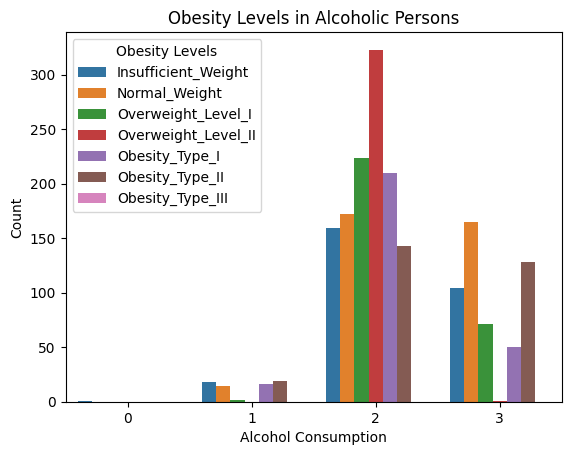

In [ ]:
# Visualizing obesity levels for individuals who consume alcohol
# 0-No Alcohol consumption, 1-Sometimes, 2- Very frequently, 3- Always consuming alcohol
sns.countplot(x='CALC', hue='NObesity_Labels', data=df, hue_order=obesity_labels.values())
plt.title('Obesity Levels in Alcoholic Persons')
plt.xlabel('Alcohol Consumption')
plt.ylabel('Count')
plt.legend(title='Obesity Levels')
plt.show()
